In [2]:
from model.config import cfg
from model.test import im_detect
from model.nms_wrapper import nms

from utils.timer import Timer
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os, cv2
import argparse

In [3]:
CLASSES = ('__background__',
           'aeroplane', 'bicycle', 'bird', 'boat',
           'bottle', 'bus', 'car', 'cat', 'chair',
           'cow', 'diningtable', 'dog', 'horse',
           'motorbike', 'person', 'pottedplant',
           'sheep', 'sofa', 'train', 'tvmonitor')

NETS = {'vgg16': ('vgg16_faster_rcnn_iter_70000.ckpt',),'res101': ('res101_faster_rcnn_iter_110000.ckpt',)}
DATASETS= {'pascal_voc': ('voc_2007_trainval',),'pascal_voc_0712': ('voc_2007_trainval+voc_2012_trainval',)}

In [4]:
cfg.TEST.HAS_RPN = True  # Use RPN for proposals
# args = parse_args()

# # model path
# demonet = args.demo_net
# dataset = args.dataset
tfmodel = os.path.join('../output', 'res101', DATASETS['pascal_voc_0712'][0], 'default',
                          NETS['res101'][0])


In [5]:
# set config
tfconfig = tf.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth=True

# init session
sess = tf.Session(config=tfconfig)

In [6]:
from nets.vgg16 import vgg16
from nets.resnet_v1 import resnetv1

net = resnetv1(num_layers=101)

In [7]:
net.create_architecture("TEST", 21, tag='default', anchor_scales=[8, 16, 32])

{'rois': <tf.Tensor 'resnet_v1_101_3/rois/concat:0' shape=(?, 5) dtype=float32>,
 'rpn_cls_score': <tf.Tensor 'resnet_v1_101_3/rpn_cls_score/BiasAdd:0' shape=(1, ?, ?, 18) dtype=float32>,
 'rpn_cls_score_reshape': <tf.Tensor 'resnet_v1_101_3/rpn_cls_score_reshape/transpose_1:0' shape=(1, ?, ?, 2) dtype=float32>,
 'rpn_cls_prob': <tf.Tensor 'resnet_v1_101_3/rpn_cls_prob/transpose_1:0' shape=(1, ?, ?, 18) dtype=float32>,
 'rpn_cls_pred': <tf.Tensor 'resnet_v1_101_3/rpn_cls_pred:0' shape=(?,) dtype=int64>,
 'rpn_bbox_pred': <tf.Tensor 'resnet_v1_101_3/rpn_bbox_pred/BiasAdd:0' shape=(1, ?, ?, 36) dtype=float32>,
 'cls_score': <tf.Tensor 'resnet_v1_101_5/cls_score/BiasAdd:0' shape=(?, 21) dtype=float32>,
 'cls_pred': <tf.Tensor 'resnet_v1_101_5/cls_pred:0' shape=(?,) dtype=int64>,
 'cls_prob': <tf.Tensor 'resnet_v1_101_5/cls_prob:0' shape=(?, 21) dtype=float32>,
 'bbox_pred': <tf.Tensor 'add:0' shape=(?, 84) dtype=float32>}

In [8]:
saver = tf.train.Saver()
saver.restore(sess, tfmodel)

INFO:tensorflow:Restoring parameters from ../output/res101/voc_2007_trainval+voc_2012_trainval/default/res101_faster_rcnn_iter_110000.ckpt


In [1]:
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.inception_v3 import preprocess_input
from keras.utils.data_utils import GeneratorEnqueuer
import matplotlib.pyplot as plt
import pandas as pd 
import numpy as np 
import math, os

%matplotlib inline

Using TensorFlow backend.


In [9]:
image_path = "../test/"

batch_size = 100
img_generator = ImageDataGenerator().flow_from_directory(image_path, shuffle=False, batch_size = batch_size)
n_rounds = math.ceil(img_generator.samples / img_generator.batch_size)
filenames = img_generator.filenames

img_generator = GeneratorEnqueuer(img_generator)
img_generator.start()
img_generator = img_generator.get()

Found 99999 images belonging to 1 classes.


In [22]:
def vis_detections(im, class_name, dets, thresh=0.5):
    """Draw detected bounding boxes."""
    inds = np.where(dets[:, -1] >= thresh)[0]
    if len(inds) == 0:
        return

    im = im[:, :, (2, 1, 0)]
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(im, aspect='equal')
    for i in inds:
        bbox = dets[i, :4]
        score = dets[i, -1]

        ax.add_patch(
            plt.Rectangle((bbox[0], bbox[1]),
                          bbox[2] - bbox[0],
                          bbox[3] - bbox[1], fill=False,
                          edgecolor='red', linewidth=3.5)
            )
        ax.text(bbox[0], bbox[1] - 2,
                '{:s} {:.3f}'.format(class_name, score),
                bbox=dict(facecolor='blue', alpha=0.5),
                fontsize=14, color='white')

    ax.set_title(('{} detections with '
                  'p({} | box) >= {:.1f}').format(class_name, class_name,
                                                  thresh),
                  fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.draw()

In [23]:
def demo(sess, net, image_name):
    """Detect object classes in an image using pre-computed object proposals."""

    # Load the demo image
    im = cv2.imread(image_name)

    # Detect all object classes and regress object bounds
    timer = Timer()
    timer.tic()
    scores, boxes = im_detect(sess, net, im)
    timer.toc()
    print('Detection took {:.3f}s for {:d} object proposals'.format(timer.total_time, boxes.shape[0]))

    # Visualize detections for each class
    CONF_THRESH = 0.8
    NMS_THRESH = 0.3
    for cls_ind, cls in enumerate(CLASSES[1:]):
        cls_ind += 1 # because we skipped background
        cls_boxes = boxes[:, 4*cls_ind:4*(cls_ind + 1)]
        cls_scores = scores[:, cls_ind]
        dets = np.hstack((cls_boxes,
                          cls_scores[:, np.newaxis])).astype(np.float32)
        keep = nms(dets, NMS_THRESH)
        dets = dets[keep, :]
        vis_detections(im, cls, dets, thresh=CONF_THRESH)

Detection took 0.128s for 300 object proposals
Detection took 0.165s for 300 object proposals
Detection took 0.276s for 300 object proposals
Detection took 0.094s for 300 object proposals
Detection took 0.103s for 300 object proposals
Detection took 0.307s for 300 object proposals
Detection took 0.094s for 300 object proposals
Detection took 0.102s for 300 object proposals
Detection took 0.101s for 300 object proposals
Detection took 0.256s for 300 object proposals
Detection took 0.094s for 300 object proposals
Detection took 0.095s for 300 object proposals
Detection took 0.092s for 300 object proposals
Detection took 0.097s for 300 object proposals
Detection took 0.297s for 300 object proposals
Detection took 0.269s for 300 object proposals
Detection took 0.090s for 300 object proposals
Detection took 0.099s for 300 object proposals
Detection took 0.103s for 300 object proposals
Detection took 0.102s for 300 object proposals


/home/chansung/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Detection took 0.082s for 300 object proposals
Detection took 0.085s for 300 object proposals


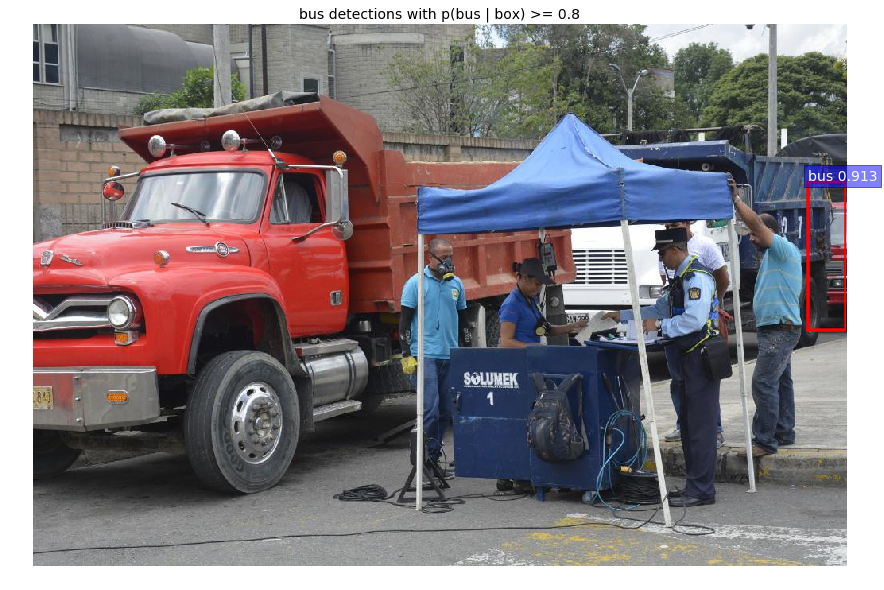

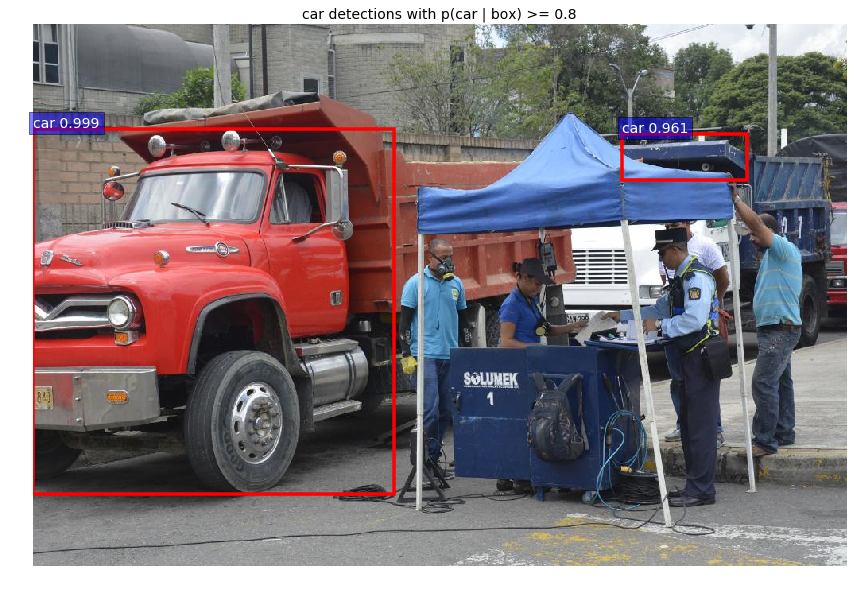

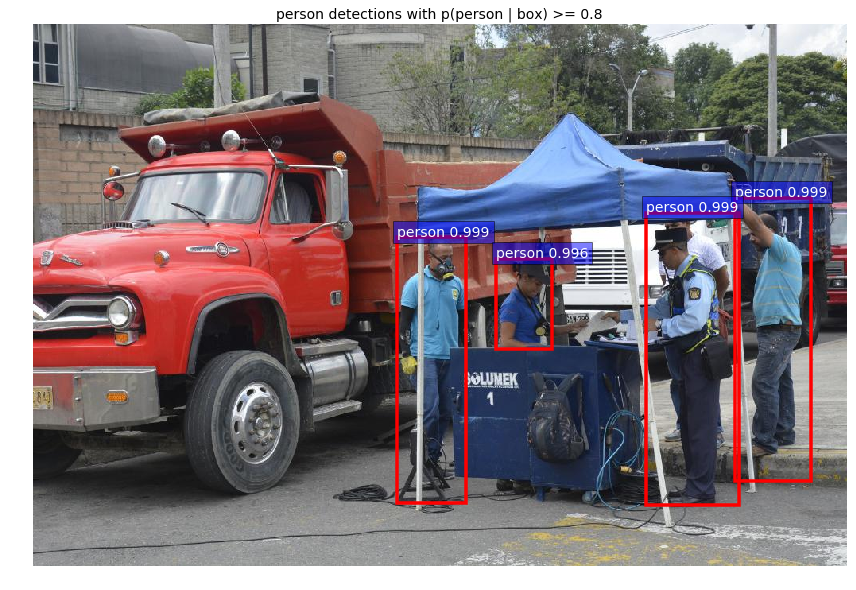

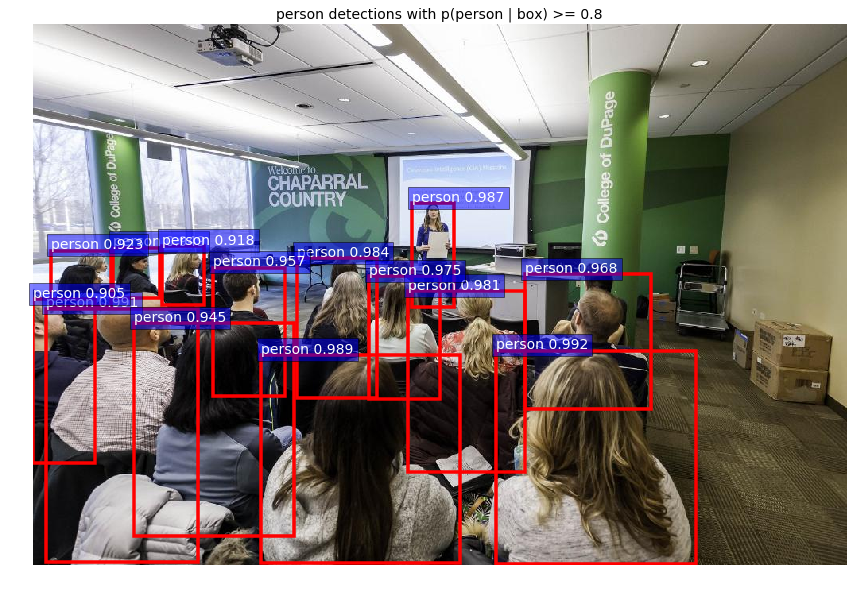

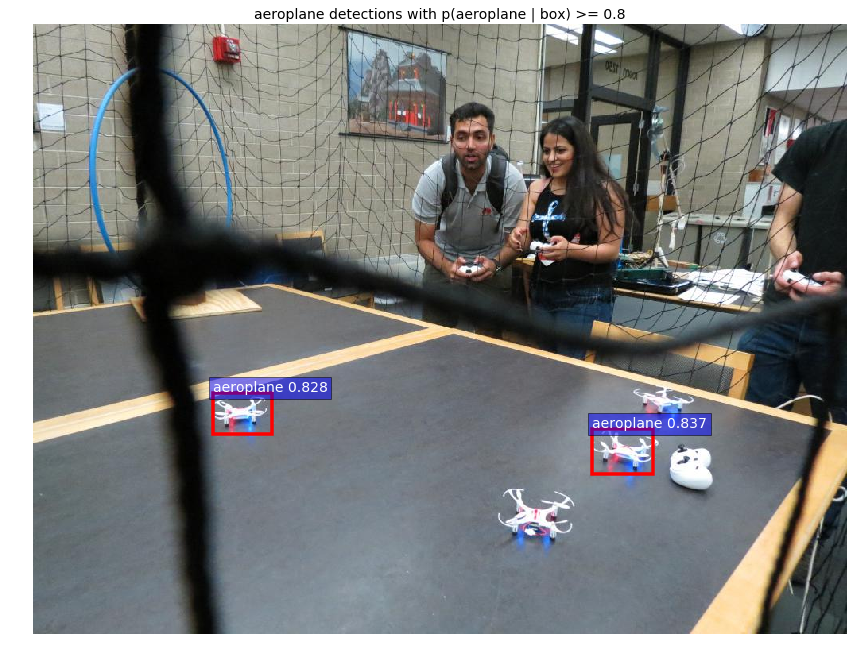

...

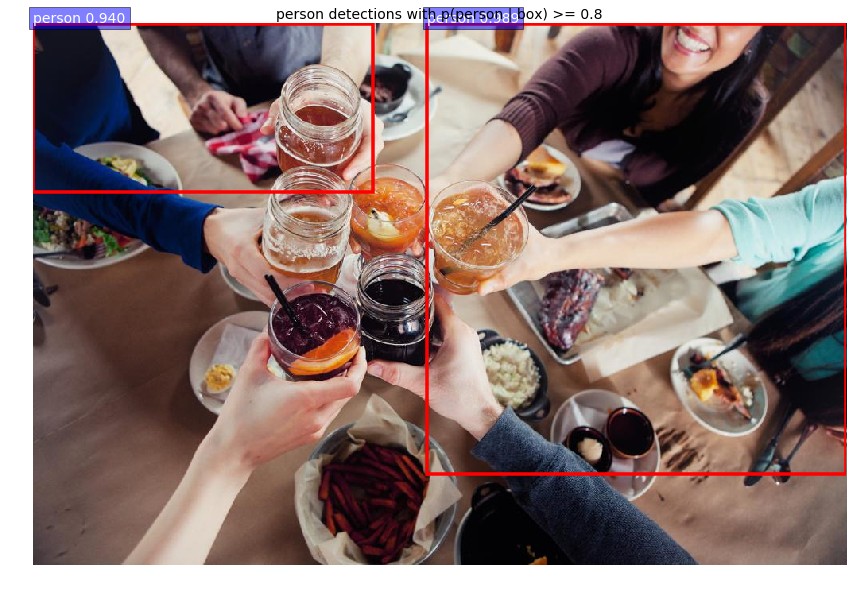

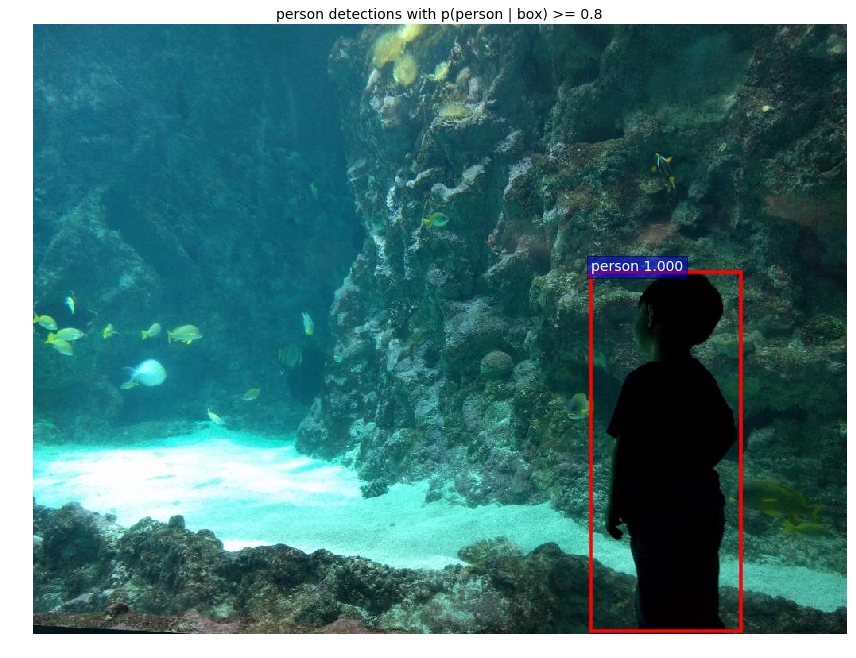

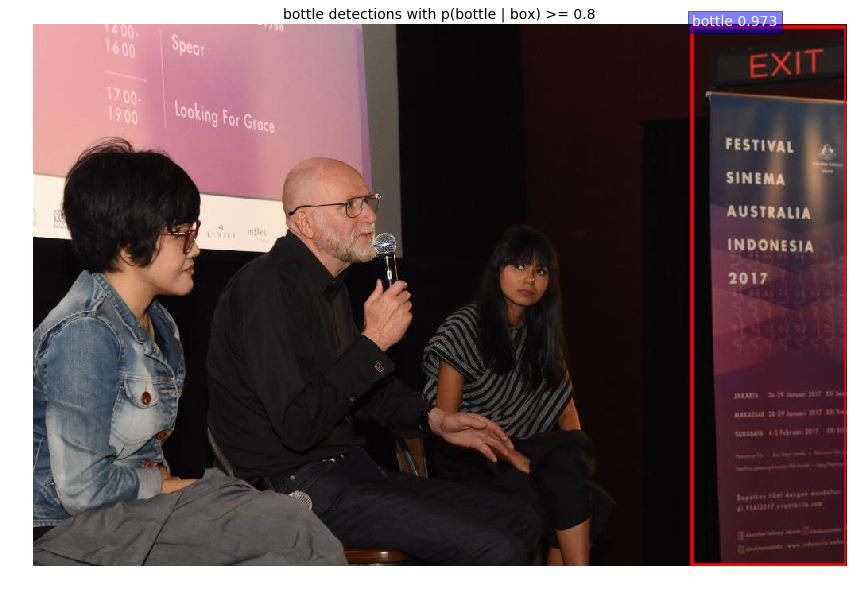

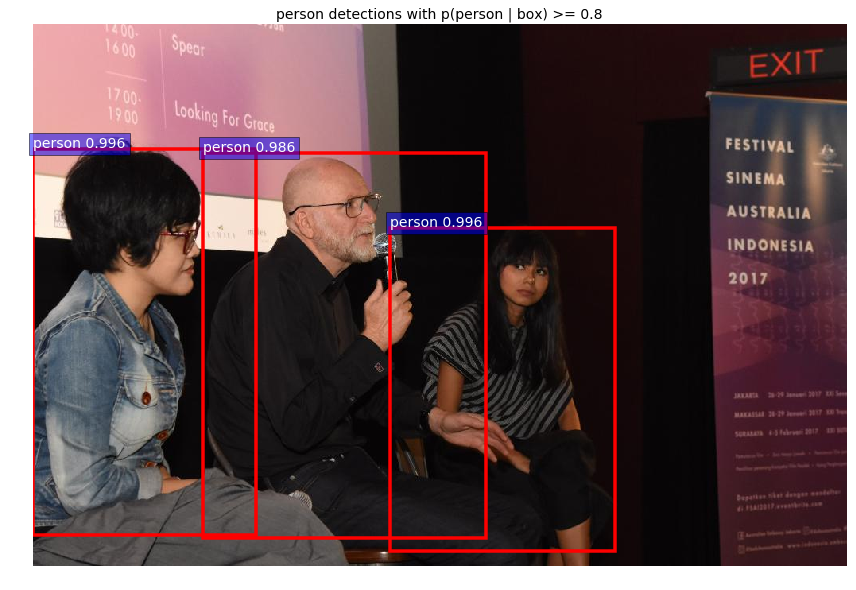

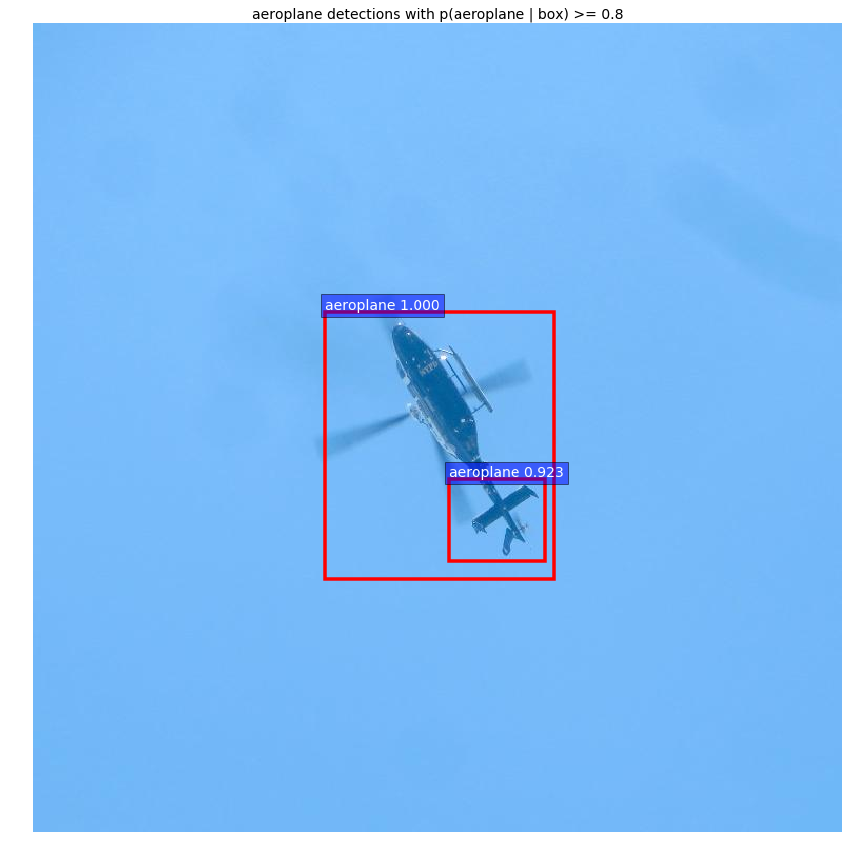

In [24]:
for i in range(n_rounds):
    batch = next(img_generator)
    for j, prediction in enumerate(batch):
        image = filenames[i * batch_size + j]
        image = "../test/" + image
#         print(image)
        demo(sess, net, image)
#         origianl_image = cv2.imread('./test/' + image)
#         origianl_image = cv2.cvtColor(origianl_image, cv2.COLOR_BGR2RGB)
        
#         results = tfnet.return_predict(origianl_image)

#         pred_str = ""
#         labels = ""
#         for eachObject in results:    
#             pred_str += rev[eachObject["label"]] + " " + str(float(eachObject["confidence"])/100) + " 0.1 0.1 0.9 0.9"
#             pred_str += " "
#             labels += eachObject['label'] + ", " + str(round(float(eachObject['confidence'])/100, 1)) 
#             labels += " | "
            
#         if labels != "":
#         plt.figure(figsize=(12,12))
#         plt.imshow(boxing(origianl_image, results))
#         plt.show()

#         print ("Labels Detected: ")
#         print (labels)
#         print ()
#         print ("Prediction String: ")
#         print (pred_str)

    if i == 10:
        break